In [2]:
import pickle
import scanpy as sc
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from distance_result import DistanceResult
from utils import get_pwdf_per_condition, get_melted_df_per_perturbation
from utils import get_flat_df, normalize_per_metric, get_distance_per_perturbation, add_rank_col
from utils import get_ranked_df_per_perturbation, calc_rank_percentile  # sensitivity plots
from utils import plt_legend

sc.set_figure_params(dpi=100, frameon=False, facecolor=None)

ryp2 is not installed. Install with pip install rpy2 to run tools with R support.

In [1]:
import warnings
warnings.filterwarnings('ignore')

In [3]:
%load_ext autoreload
%autoreload 2

In [14]:
%%time
dataset = 'sim'
with open(f'/lustre/scratch/users/yuge.ji/metrics_revisions/{dataset}.pkl', 'rb') as file:
    results = pickle.load(file)
print(results.keys())

dict_keys(['10-lognorm-n_genes', '50-lognorm-n_genes', '100-lognorm-n_genes', '500-lognorm-n_genes', '1000-lognorm-n_genes', '2000-lognorm-n_genes', '5000-lognorm-n_genes', '10-lognorm-n_cells', '20-lognorm-n_cells', '30-lognorm-n_cells', '50-lognorm-n_cells', '70-lognorm-n_cells', '100-lognorm-n_cells', '0.498-lognorm-count_mean', '10-lognorm-n_DEGs', '20-lognorm-n_DEGs', '30-lognorm-n_DEGs', '40-lognorm-n_DEGs', '50-lognorm-n_DEGs', '100-lognorm-n_DEGs', '150-lognorm-n_DEGs', '200-lognorm-n_DEGs', '300-lognorm-n_DEGs', '400-lognorm-n_DEGs', '10-counts-n_genes', '50-counts-n_genes', '100-counts-n_genes', '500-counts-n_genes', '1000-counts-n_genes', '2000-counts-n_genes', '5000-counts-n_genes', '10-counts-n_cells', '20-counts-n_cells', '30-counts-n_cells', '50-counts-n_cells', '70-counts-n_cells', '100-counts-n_cells', '0.498-counts-count_mean', '10-counts-n_DEGs', '20-counts-n_DEGs', '30-counts-n_DEGs', '40-counts-n_DEGs', '50-counts-n_DEGs', '100-counts-n_DEGs', '150-counts-n_DEGs', 

In [5]:
metrics = list(results.values())[0].metrics
metrics

['euclidean',
 'spearman_distance',
 'mean_absolute_error',
 'r2_distance',
 'pearson_distance',
 'mse',
 'cosine_distance',
 'edistance',
 'sym_kldiv',
 'mmd',
 'mmd_rbf',
 'ks_test',
 't_test',
 'wasserstein',
 'classifier_proba',
 'classifier_cp',
 'kendalltau_distance']

In [6]:
controls = ['control0', 'control1', 'control2', 'control3', 'control4']

In [7]:
# modified from %load plotting_util.py
def plot(tags, results, plot=True):
    label_tag = tags[0]
    
    pwdfs = {}
    for k, res in results.items():
        if all(t in k for t in tags):
            pwdfs.update(res.pwdfs)
    
    if len(pwdfs) < 2:
        raise ValueError(f'Conditions {tags} were not run.')

    individually_ranked = get_ranked_df_per_perturbation(pwdfs, metrics, controls, label_tag)
    ctrl_ranks = calc_rank_percentile(individually_ranked, controls)

    if plot:
        melted_df = get_flat_df(pwdfs, controls, label=label_tag)
        plt.figure(figsize=(10, 5))
        sns.lineplot(data=normalize_per_metric(melted_df), x=label_tag, y='avg_dist', hue='metric')
        plt.ylabel('relative avg dist');
        if 'n_genes' in label_tag:
            plt.xscale('log')
        plt_legend()
        plt.title(f'distance behavior w.r.t {label_tag} in {tags[1]} space')
        plt.show()

        ctrl_ranks[label_tag] = ctrl_ranks[label_tag].astype(float)
        plt.figure(figsize=(10, 5))
        sns.lineplot(data=ctrl_ranks, x=label_tag, y='rank', hue='metric')
        plt.ylabel('control rank percentile')
        plt.ylim(-.05, .2)
        if 'n_genes' in label_tag:
            plt.xscale('log')
        plt_legend()
        plt.title(f'sensitivity w.r.t. {label_tag} in {tags[1]} space')
        plt.show()
    
    return pwdfs, ctrl_ranks

## n_cells

Calculate and visualize change in distance due to sample size, and where distances become unstable.

In [8]:
import numpy as np
import pandas as pd

def identify_pmax_by_marginal_gain(
    df,
    perf_col="rank",
    metric_col="metric",
    n_col="n_cells",
    marginal_frac=0.05,
    require_consecutive=2,
    threshold_mode="relative",   # "relative" or "absolute"
    perf_range=1.0,              # used if threshold_mode == "absolute"
):
    df = df.copy()
    df[n_col] = pd.to_numeric(df[n_col], errors="coerce")
    df[perf_col] = pd.to_numeric(df[perf_col], errors="coerce")
    df = df.dropna(subset=[metric_col, n_col, perf_col])

    curve_df = (
        df.groupby([metric_col, n_col], as_index=False)[perf_col]
        .mean()
        .sort_values([metric_col, n_col])
        .reset_index(drop=True)
    )

    all_curves = []
    summaries = []

    for metric, g in curve_df.groupby(metric_col, sort=False):
        g = g.sort_values(n_col).copy().reset_index(drop=True)

        # lower is better
        g["delta_perf"] = g[perf_col].shift(1) - g[perf_col]
        total_observed_gain = g[perf_col].iloc[0] - g[perf_col].iloc[-1]

        if threshold_mode == "relative":
            threshold = marginal_frac * abs(total_observed_gain)
        elif threshold_mode == "absolute":
            threshold = marginal_frac * perf_range
        else:
            raise ValueError("threshold_mode must be 'relative' or 'absolute'")

        # allow small worsening; only reject if overall worsening exceeds threshold
        overall_gets_worse_too_much = total_observed_gain < -threshold

        # marginal means the step change is small in magnitude, whether improving or worsening
        g["is_marginal"] = g["delta_perf"].abs() <= threshold

        plateau_found = False
        plateau_start_n = np.nan
        pmax = np.nan
        plateau_n_values = []

        if (not overall_gets_worse_too_much) and (len(g) >= require_consecutive + 1):
            tail = g["is_marginal"].iloc[-require_consecutive:].fillna(False).to_numpy()

            if tail.all():
                # start from the first row in the trailing marginal block
                start_idx = len(g) - require_consecutive

                # expand backward while the preceding step is also marginal
                while start_idx > 1 and bool(g.loc[start_idx - 1, "is_marginal"]):
                    start_idx -= 1

                plateau_found = True
                plateau_start_n = g.loc[start_idx, n_col]
                plateau_region = g.loc[g[n_col] >= plateau_start_n, perf_col]
                pmax = plateau_region.mean()
                plateau_n_values = g.loc[g[n_col] >= plateau_start_n, n_col].tolist()

        g["plateau_found"] = plateau_found
        g["plateau_start_n"] = plateau_start_n
        g["pmax"] = pmax
        g["overall_gets_worse_too_much"] = overall_gets_worse_too_much
        g["marginal_gain_threshold"] = threshold

        all_curves.append(g)

        summaries.append({
            metric_col: metric,
            "plateau_found": plateau_found,
            "overall_gets_worse_too_much": overall_gets_worse_too_much,
            "plateau_start_n": plateau_start_n,
            "pmax": pmax,
            "total_observed_gain": total_observed_gain,
            "marginal_gain_threshold": threshold,
            "plateau_n_values": plateau_n_values,
        })

    summary_df = pd.DataFrame(summaries)
    curve_df = pd.concat(all_curves, ignore_index=True)
    return summary_df, curve_df

tahoeBT474


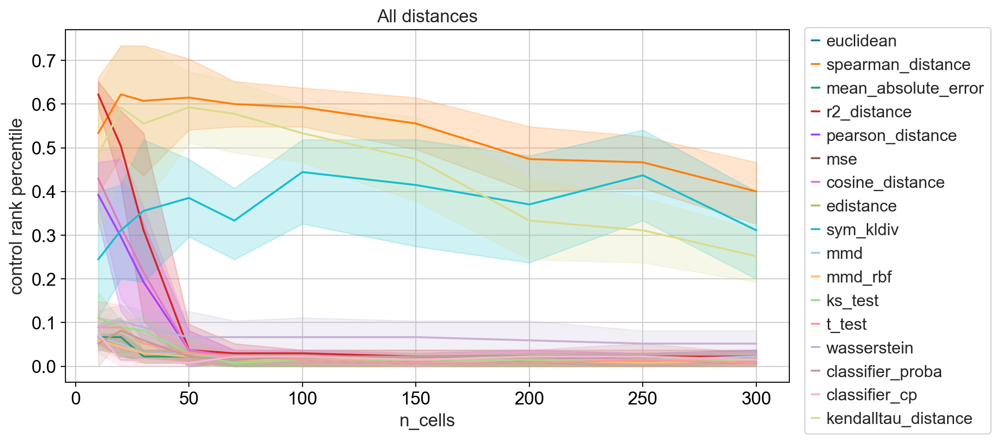

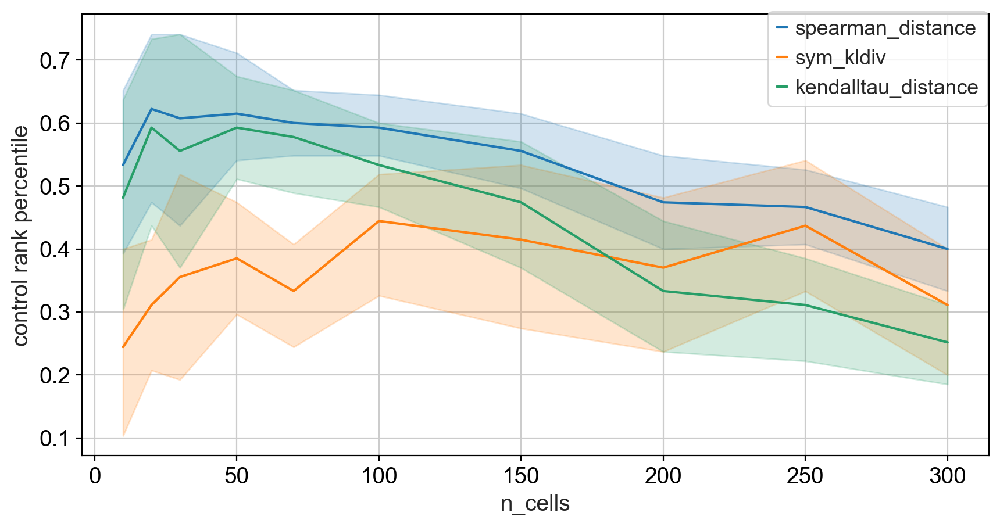

,metric,plateau_found,overall_gets_worse_too_much,plateau_start_n,pmax,total_observed_gain,marginal_gain_threshold,plateau_n_values
0,classifier_cp,True,False,30.0,0.017593,0.059259,0.05,"[30, 50, 70, 100, 150, 200, 250, 300]"
1,classifier_proba,True,False,20.0,0.031276,0.037037,0.05,"[20, 30, 50, 70, 100, 150, 200, 250, 300]"
2,cosine_distance,True,False,70.0,0.019753,0.407407,0.05,"[70, 100, 150, 200, 250, 300]"
3,edistance,True,False,20.0,0.020576,0.044444,0.05,"[20, 30, 50, 70, 100, 150, 200, 250, 300]"
4,euclidean,True,False,20.0,0.020576,0.051852,0.05,"[20, 30, 50, 70, 100, 150, 200, 250, 300]"
5,kendalltau_distance,False,False,NaN,NaN,0.229630,0.05,[]
6,ks_test,True,False,70.0,0.013580,0.096296,0.05,"[70, 100, 150, 200, 250, 300]"
7,mean_absolute_error,True,False,20.0,0.019753,0.059259,0.05,"[20, 30, 50, 70, 100, 150, 200, 250, 300]"
8,mmd,True,False,20.0,0.022222,0.044444,0.05,"[20, 30, 50, 70, 100, 150, 200, 250, 300]"
9,mmd_rbf,True,False,20.0,0.019753,0.044444,0.05,"[20, 30, 50, 70, 100, 150, 200, 250, 300]"


garcia


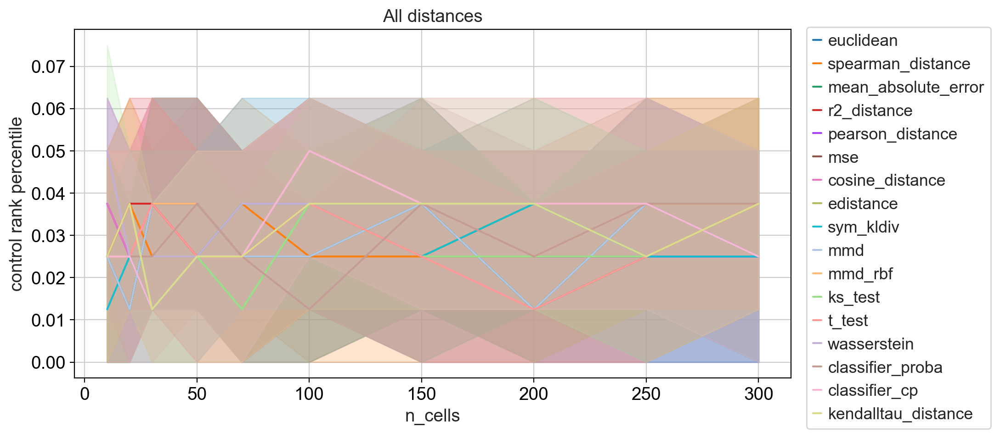

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


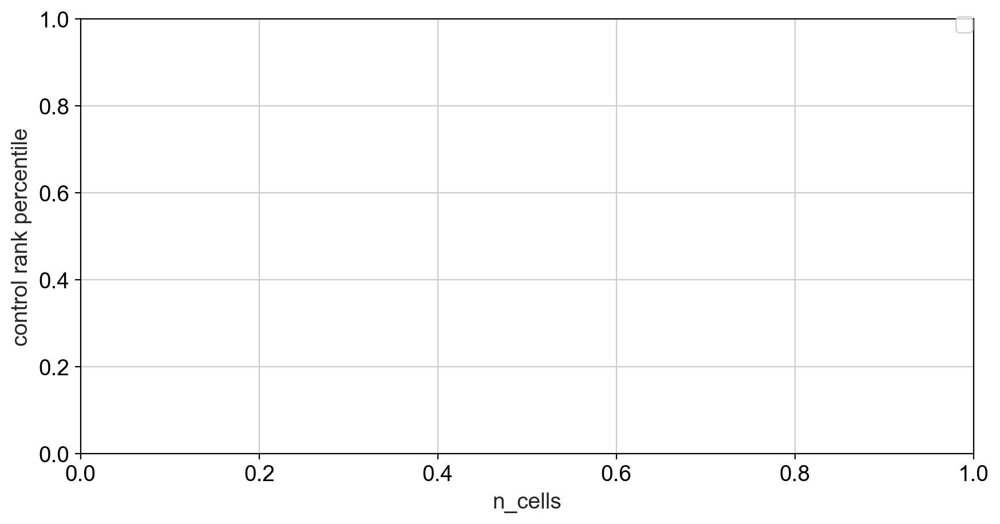

,metric,plateau_found,overall_gets_worse_too_much,plateau_start_n,pmax,total_observed_gain,marginal_gain_threshold,plateau_n_values
0,classifier_cp,True,False,20,0.030556,0.0000,0.05,"[20, 30, 50, 70, 100, 150, 200, 250, 300]"
1,classifier_proba,True,False,20,0.029167,-0.0125,0.05,"[20, 30, 50, 70, 100, 150, 200, 250, 300]"
2,cosine_distance,True,False,20,0.029167,0.0125,0.05,"[20, 30, 50, 70, 100, 150, 200, 250, 300]"
3,edistance,True,False,20,0.027778,0.0000,0.05,"[20, 30, 50, 70, 100, 150, 200, 250, 300]"
4,euclidean,True,False,20,0.029167,0.0000,0.05,"[20, 30, 50, 70, 100, 150, 200, 250, 300]"
5,kendalltau_distance,True,False,20,0.030556,-0.0125,0.05,"[20, 30, 50, 70, 100, 150, 200, 250, 300]"
6,ks_test,True,False,20,0.026389,-0.0125,0.05,"[20, 30, 50, 70, 100, 150, 200, 250, 300]"
7,mean_absolute_error,True,False,20,0.026389,0.0000,0.05,"[20, 30, 50, 70, 100, 150, 200, 250, 300]"
8,mmd,True,False,20,0.027778,0.0000,0.05,"[20, 30, 50, 70, 100, 150, 200, 250, 300]"
9,mmd_rbf,True,False,20,0.031944,-0.0125,0.05,"[20, 30, 50, 70, 100, 150, 200, 250, 300]"


sim


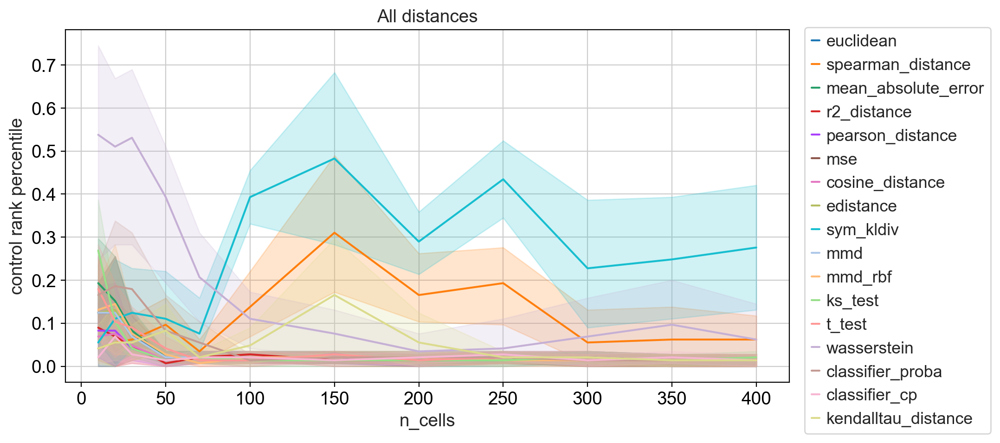

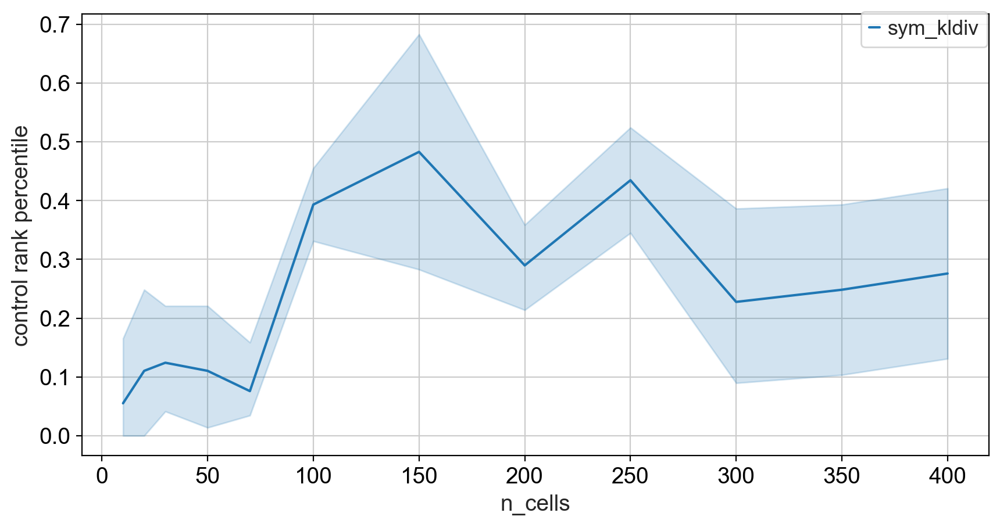

,metric,plateau_found,overall_gets_worse_too_much,plateau_start_n,pmax,total_observed_gain,marginal_gain_threshold,plateau_n_values
0,classifier_cp,True,False,20.0,0.023824,0.006897,0.05,"[20, 30, 50, 70, 100, 150, 200, 250, 300, 350,..."
1,classifier_proba,True,False,70.0,0.021552,0.151724,0.05,"[70, 100, 150, 200, 250, 300, 350, 400]"
2,cosine_distance,True,False,20.0,0.025705,0.055172,0.05,"[20, 30, 50, 70, 100, 150, 200, 250, 300, 350,..."
3,edistance,True,False,50.0,0.018391,0.110345,0.05,"[50, 70, 100, 150, 200, 250, 300, 350, 400]"
4,euclidean,True,False,70.0,0.018103,0.110345,0.05,"[70, 100, 150, 200, 250, 300, 350, 400]"
5,kendalltau_distance,True,False,250.0,0.017241,0.027586,0.05,"[250, 300, 350, 400]"
6,ks_test,True,False,50.0,0.016092,0.248276,0.05,"[50, 70, 100, 150, 200, 250, 300, 350, 400]"
7,mean_absolute_error,True,False,70.0,0.017241,0.179310,0.05,"[70, 100, 150, 200, 250, 300, 350, 400]"
8,mmd,True,False,50.0,0.019157,0.110345,0.05,"[50, 70, 100, 150, 200, 250, 300, 350, 400]"
9,mmd_rbf,True,False,50.0,0.016858,0.117241,0.05,"[50, 70, 100, 150, 200, 250, 300, 350, 400]"


mcfarland


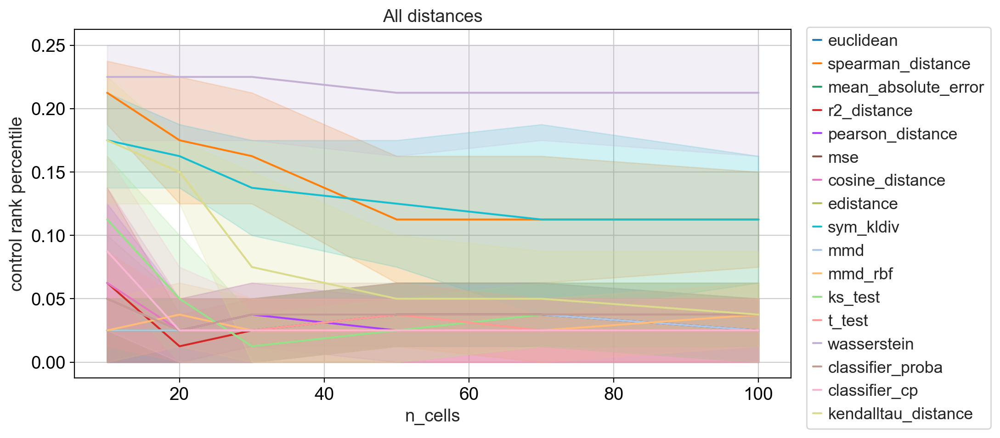

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


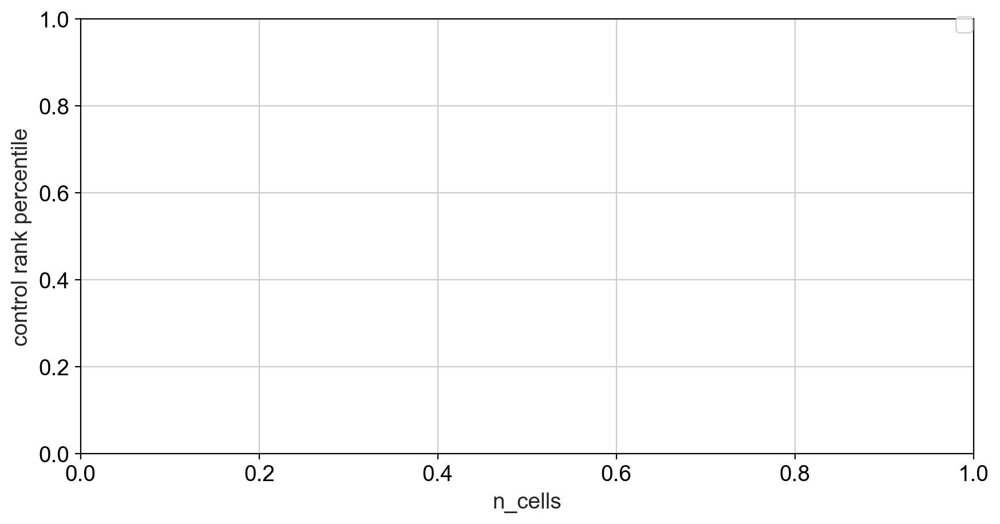

,metric,plateau_found,overall_gets_worse_too_much,plateau_start_n,pmax,total_observed_gain,marginal_gain_threshold,plateau_n_values
0,classifier_cp,True,False,30,0.025000,0.0625,0.05,"[30, 50, 70, 100]"
1,classifier_proba,True,False,20,0.035000,0.0125,0.05,"[20, 30, 50, 70, 100]"
2,cosine_distance,True,False,20,0.025000,0.0375,0.05,"[20, 30, 50, 70, 100]"
3,edistance,True,False,20,0.027500,0.0000,0.05,"[20, 30, 50, 70, 100]"
4,euclidean,True,False,20,0.030000,0.0000,0.05,"[20, 30, 50, 70, 100]"
5,kendalltau_distance,True,False,50,0.045833,0.1375,0.05,"[50, 70, 100]"
6,ks_test,True,False,30,0.028125,0.0750,0.05,"[30, 50, 70, 100]"
7,mean_absolute_error,True,False,20,0.032500,-0.0125,0.05,"[20, 30, 50, 70, 100]"
8,mmd,True,False,20,0.030000,0.0000,0.05,"[20, 30, 50, 70, 100]"
9,mmd_rbf,True,False,20,0.030000,-0.0125,0.05,"[20, 30, 50, 70, 100]"


norman


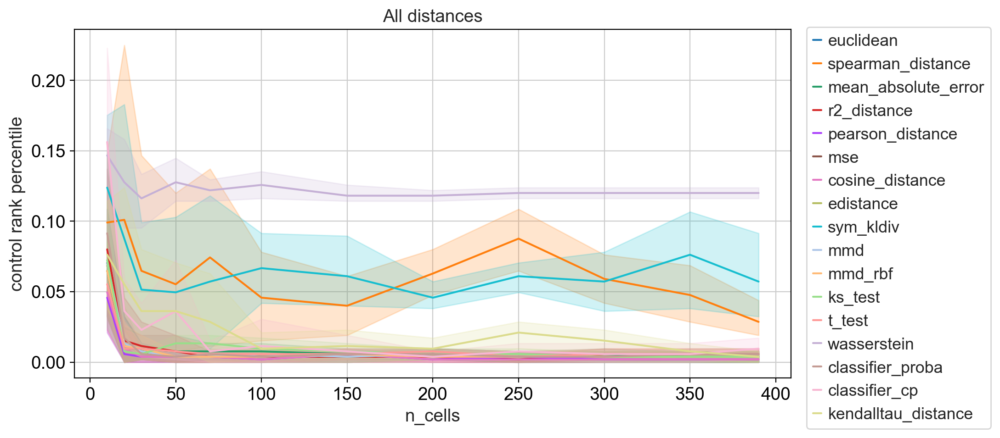

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


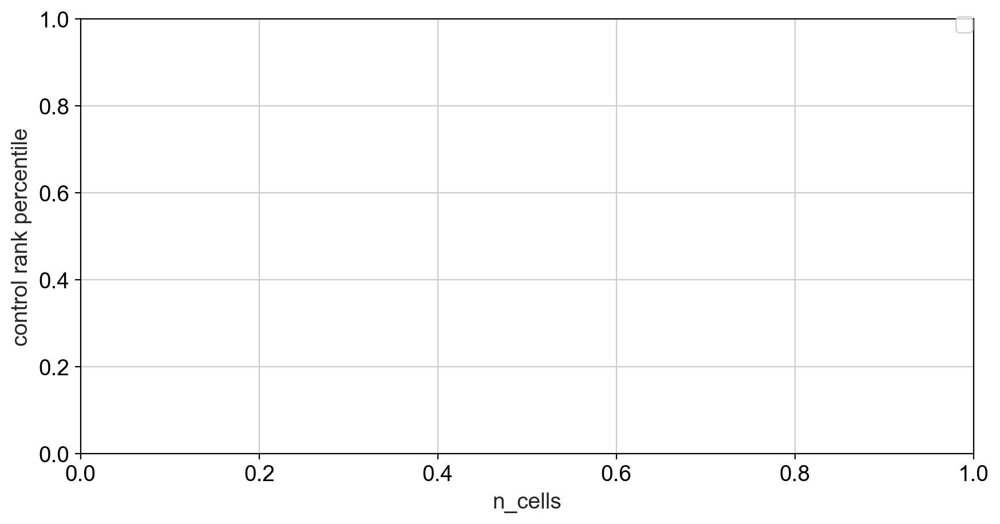

,metric,plateau_found,overall_gets_worse_too_much,plateau_start_n,pmax,total_observed_gain,marginal_gain_threshold,plateau_n_values
0,classifier_cp,True,False,30,0.011810,0.146667,0.05,"[30, 50, 70, 100, 150, 200, 250, 300, 350, 390]"
1,classifier_proba,True,False,30,0.004952,0.085714,0.05,"[30, 50, 70, 100, 150, 200, 250, 300, 350, 390]"
2,cosine_distance,True,False,20,0.003463,0.047619,0.05,"[20, 30, 50, 70, 100, 150, 200, 250, 300, 350,..."
3,edistance,True,False,30,0.004571,0.064762,0.05,"[30, 50, 70, 100, 150, 200, 250, 300, 350, 390]"
4,euclidean,True,False,30,0.004381,0.066667,0.05,"[30, 50, 70, 100, 150, 200, 250, 300, 350, 390]"
5,kendalltau_distance,True,False,20,0.021299,0.072381,0.05,"[20, 30, 50, 70, 100, 150, 200, 250, 300, 350,..."
6,ks_test,True,False,30,0.007238,0.068571,0.05,"[30, 50, 70, 100, 150, 200, 250, 300, 350, 390]"
7,mean_absolute_error,True,False,30,0.006095,0.060952,0.05,"[30, 50, 70, 100, 150, 200, 250, 300, 350, 390]"
8,mmd,True,False,30,0.004571,0.066667,0.05,"[30, 50, 70, 100, 150, 200, 250, 300, 350, 390]"
9,mmd_rbf,True,False,30,0.004571,0.060952,0.05,"[30, 50, 70, 100, 150, 200, 250, 300, 350, 390]"


satinha


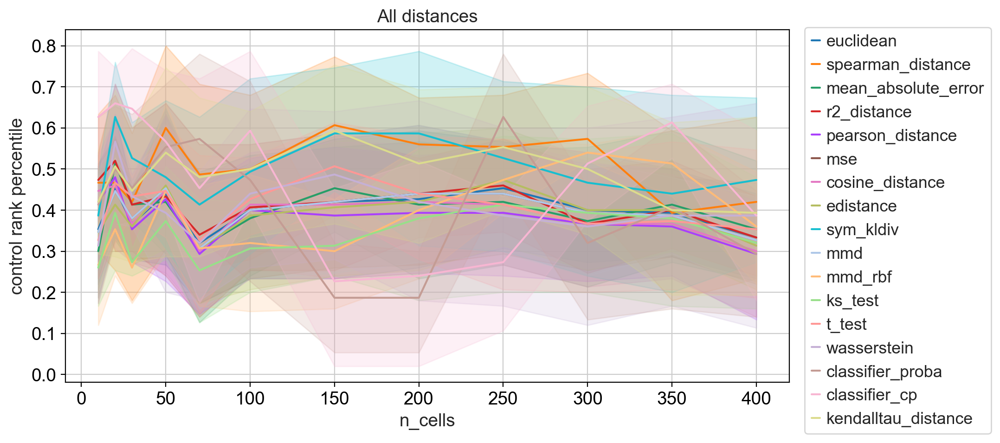

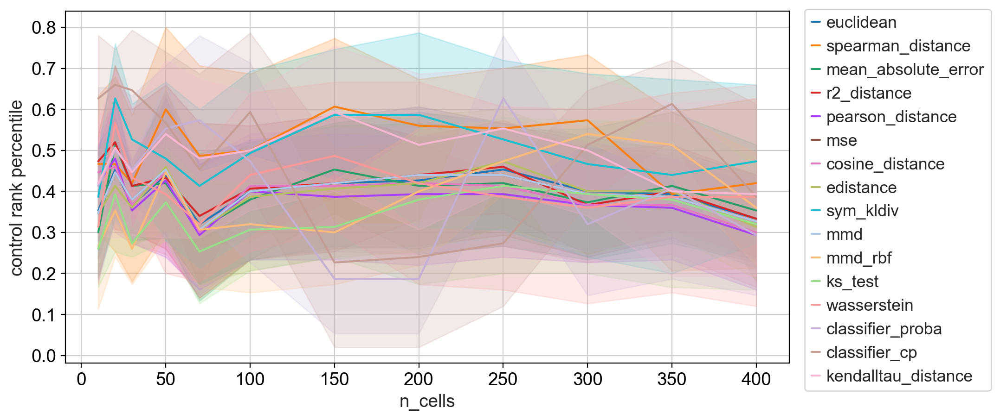

,metric,plateau_found,overall_gets_worse_too_much,plateau_start_n,pmax,total_observed_gain,marginal_gain_threshold,plateau_n_values
0,classifier_cp,False,False,NaN,NaN,0.240000,0.05,[]
1,classifier_proba,False,False,NaN,NaN,0.120000,0.05,[]
2,cosine_distance,False,False,NaN,NaN,0.146667,0.05,[]
3,edistance,False,False,NaN,NaN,0.033333,0.05,[]
4,euclidean,False,False,NaN,NaN,0.020000,0.05,[]
5,kendalltau_distance,False,False,NaN,NaN,0.026667,0.05,[]
6,ks_test,False,True,NaN,NaN,-0.060000,0.05,[]
7,mean_absolute_error,False,True,NaN,NaN,-0.053333,0.05,[]
8,mmd,False,False,NaN,NaN,0.020000,0.05,[]
9,mmd_rbf,False,True,NaN,NaN,-0.093333,0.05,[]


schiebinger


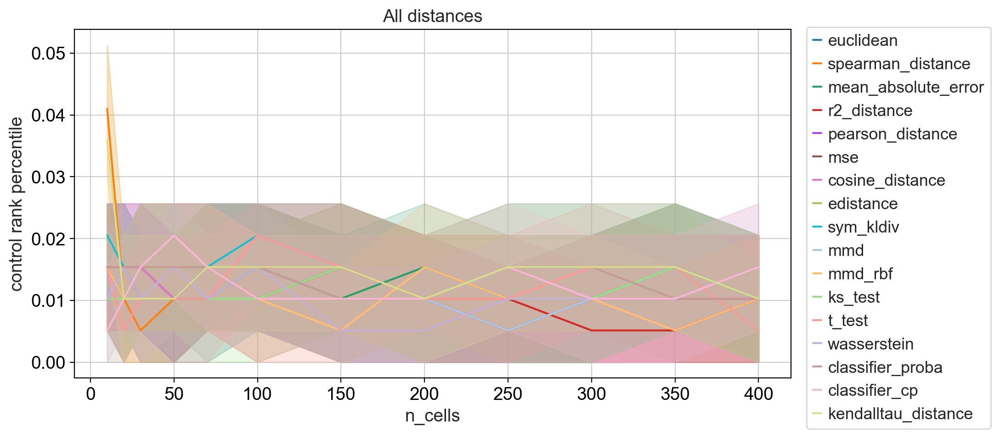

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


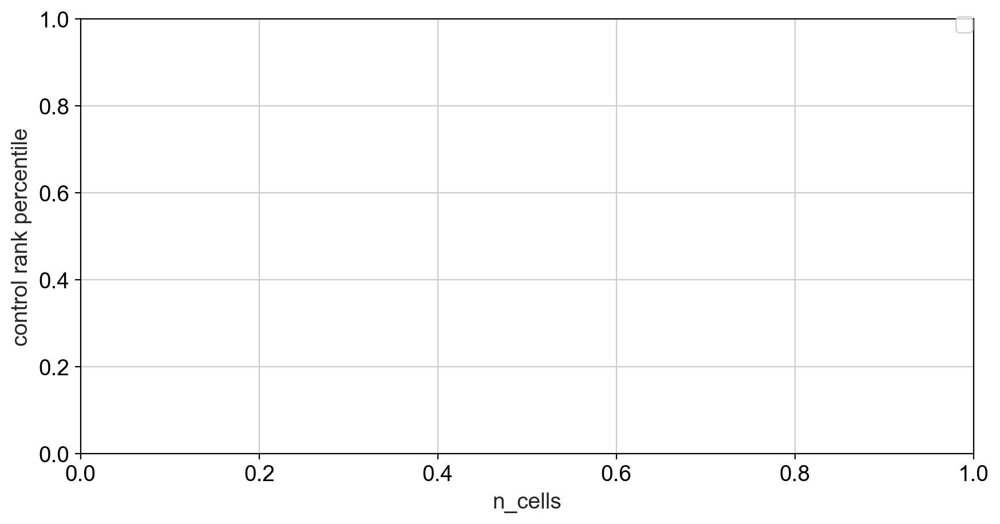

,metric,plateau_found,overall_gets_worse_too_much,plateau_start_n,pmax,total_observed_gain,marginal_gain_threshold,plateau_n_values
0,classifier_cp,True,False,20,0.013054,-0.010256,0.05,"[20, 30, 50, 70, 100, 150, 200, 250, 300, 350,..."
1,classifier_proba,True,False,20,0.013520,0.005128,0.05,"[20, 30, 50, 70, 100, 150, 200, 250, 300, 350,..."
2,cosine_distance,True,False,20,0.011655,0.005128,0.05,"[20, 30, 50, 70, 100, 150, 200, 250, 300, 350,..."
3,edistance,True,False,20,0.012121,0.005128,0.05,"[20, 30, 50, 70, 100, 150, 200, 250, 300, 350,..."
4,euclidean,True,False,20,0.012121,0.005128,0.05,"[20, 30, 50, 70, 100, 150, 200, 250, 300, 350,..."
5,kendalltau_distance,True,False,20,0.013054,0.025641,0.05,"[20, 30, 50, 70, 100, 150, 200, 250, 300, 350,..."
6,ks_test,True,False,20,0.011655,0.005128,0.05,"[20, 30, 50, 70, 100, 150, 200, 250, 300, 350,..."
7,mean_absolute_error,True,False,20,0.012121,0.005128,0.05,"[20, 30, 50, 70, 100, 150, 200, 250, 300, 350,..."
8,mmd,True,False,20,0.012121,0.005128,0.05,"[20, 30, 50, 70, 100, 150, 200, 250, 300, 350,..."
9,mmd_rbf,True,False,20,0.011189,0.005128,0.05,"[20, 30, 50, 70, 100, 150, 200, 250, 300, 350,..."


spA549


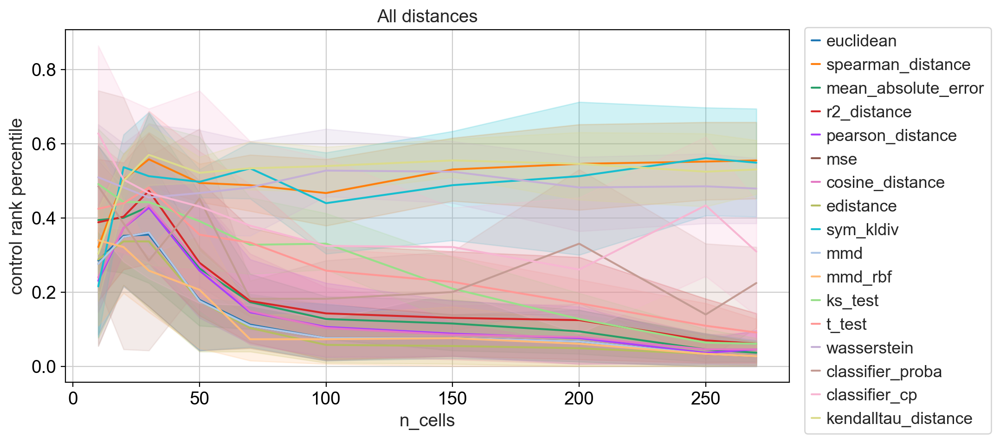

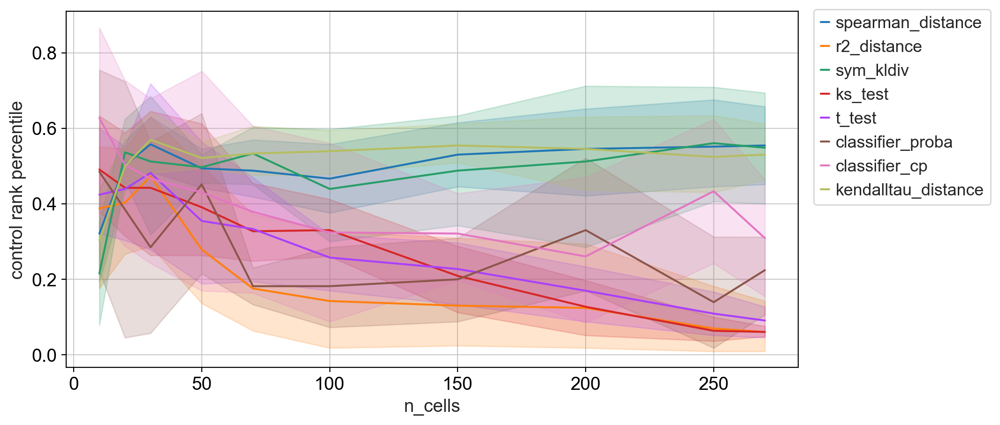

,metric,plateau_found,overall_gets_worse_too_much,plateau_start_n,pmax,total_observed_gain,marginal_gain_threshold,plateau_n_values
0,classifier_cp,False,False,NaN,NaN,0.318182,0.05,[]
1,classifier_proba,False,False,NaN,NaN,0.260606,0.05,[]
2,cosine_distance,True,False,100.0,0.071515,0.193939,0.05,"[100, 150, 200, 250, 270]"
3,edistance,True,False,100.0,0.044242,0.260606,0.05,"[100, 150, 200, 250, 270]"
4,euclidean,True,False,100.0,0.055758,0.257576,0.05,"[100, 150, 200, 250, 270]"
5,kendalltau_distance,False,True,NaN,NaN,-0.227273,0.05,[]
6,ks_test,False,False,NaN,NaN,0.430303,0.05,[]
7,mean_absolute_error,True,False,100.0,0.083636,0.357576,0.05,"[100, 150, 200, 250, 270]"
8,mmd,True,False,100.0,0.055758,0.248485,0.05,"[100, 150, 200, 250, 270]"
9,mmd_rbf,True,False,100.0,0.053939,0.312121,0.05,"[100, 150, 200, 250, 270]"


spK562


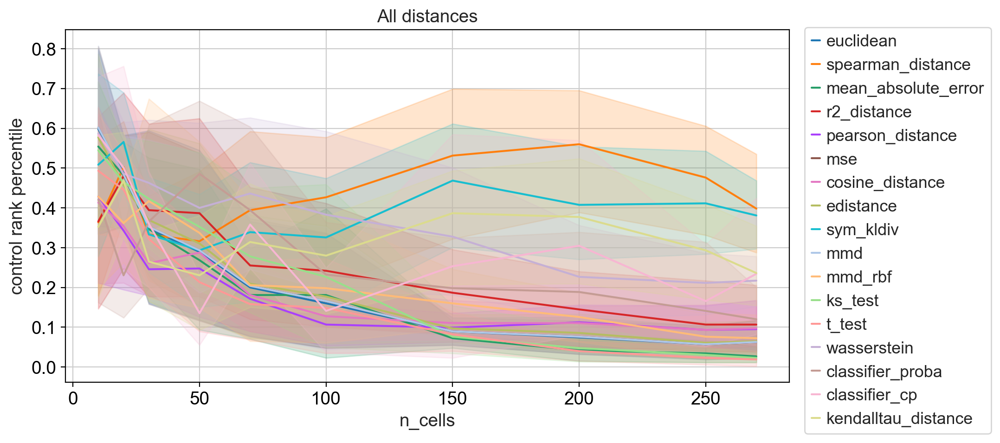

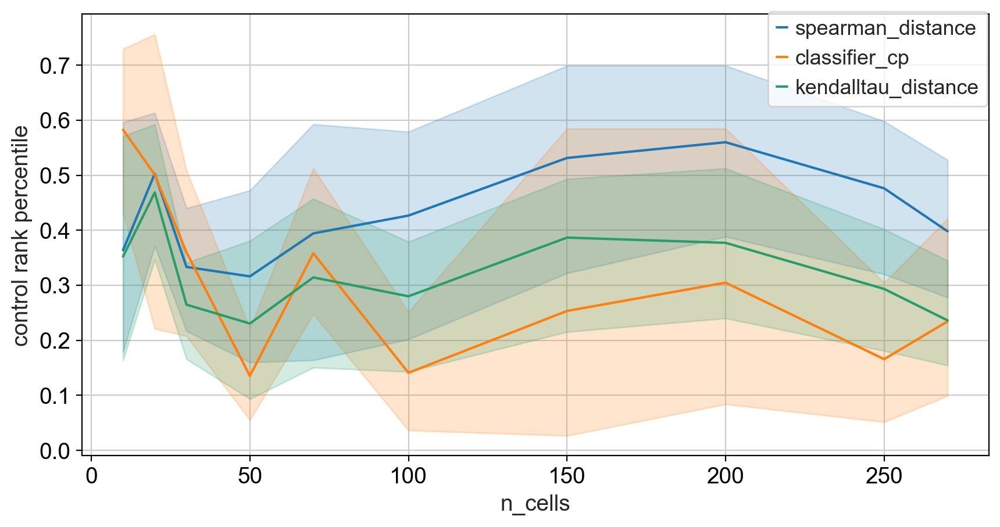

,metric,plateau_found,overall_gets_worse_too_much,plateau_start_n,pmax,total_observed_gain,marginal_gain_threshold,plateau_n_values
0,classifier_cp,False,False,NaN,NaN,0.348571,0.05,[]
1,classifier_proba,True,False,150.0,0.161905,0.300952,0.05,"[150, 200, 250, 270]"
2,cosine_distance,True,False,150.0,0.102857,0.316190,0.05,"[150, 200, 250, 270]"
3,edistance,True,False,200.0,0.070476,0.512381,0.05,"[200, 250, 270]"
4,euclidean,True,False,200.0,0.064762,0.535238,0.05,"[200, 250, 270]"
5,kendalltau_distance,False,False,NaN,NaN,0.116190,0.05,[]
6,ks_test,True,False,200.0,0.033651,0.521905,0.05,"[200, 250, 270]"
7,mean_absolute_error,True,False,200.0,0.034286,0.527619,0.05,"[200, 250, 270]"
8,mmd,True,False,200.0,0.065397,0.539048,0.05,"[200, 250, 270]"
9,mmd_rbf,True,False,100.0,0.126476,0.356190,0.05,"[100, 150, 200, 250, 270]"


spMCF7


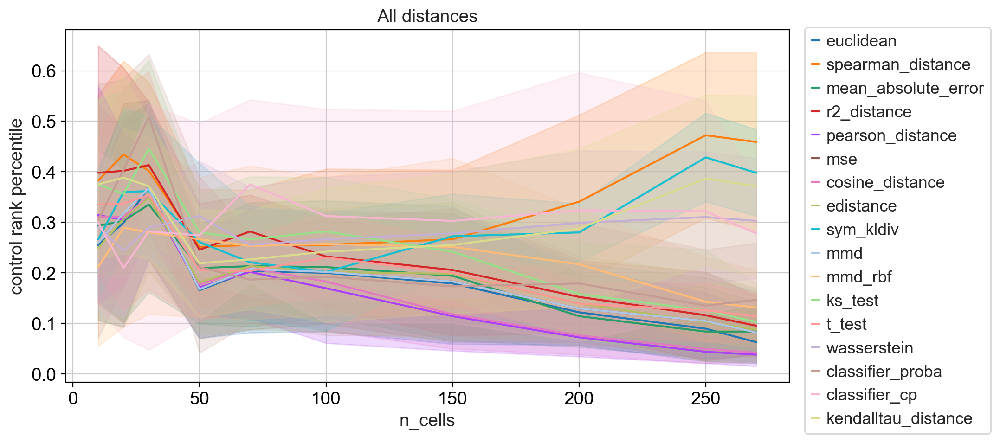

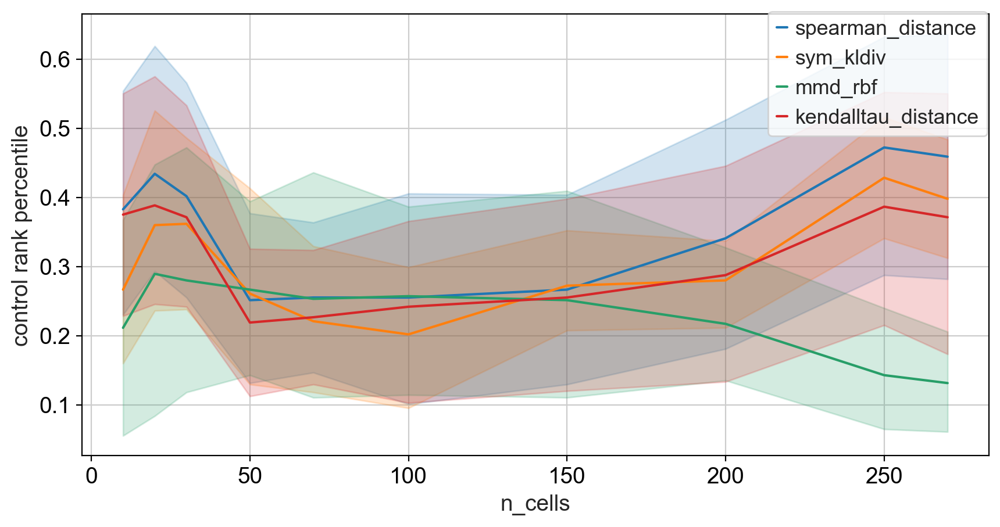

,metric,plateau_found,overall_gets_worse_too_much,plateau_start_n,pmax,total_observed_gain,marginal_gain_threshold,plateau_n_values
0,classifier_cp,True,False,150.0,0.306667,0.020952,0.05,"[150, 200, 250, 270]"
1,classifier_proba,True,False,70.0,0.168889,0.158095,0.05,"[70, 100, 150, 200, 250, 270]"
2,cosine_distance,True,False,200.0,0.055873,0.268571,0.05,"[200, 250, 270]"
3,edistance,True,False,250.0,0.095238,0.161905,0.05,"[250, 270]"
4,euclidean,True,False,250.0,0.076190,0.192381,0.05,"[250, 270]"
5,kendalltau_distance,False,False,NaN,NaN,0.003810,0.05,[]
6,ks_test,True,False,250.0,0.114286,0.272381,0.05,"[250, 270]"
7,mean_absolute_error,True,False,250.0,0.083810,0.209524,0.05,"[250, 270]"
8,mmd,True,False,250.0,0.093333,0.177143,0.05,"[250, 270]"
9,mmd_rbf,False,False,NaN,NaN,0.080000,0.05,[]


tahoe


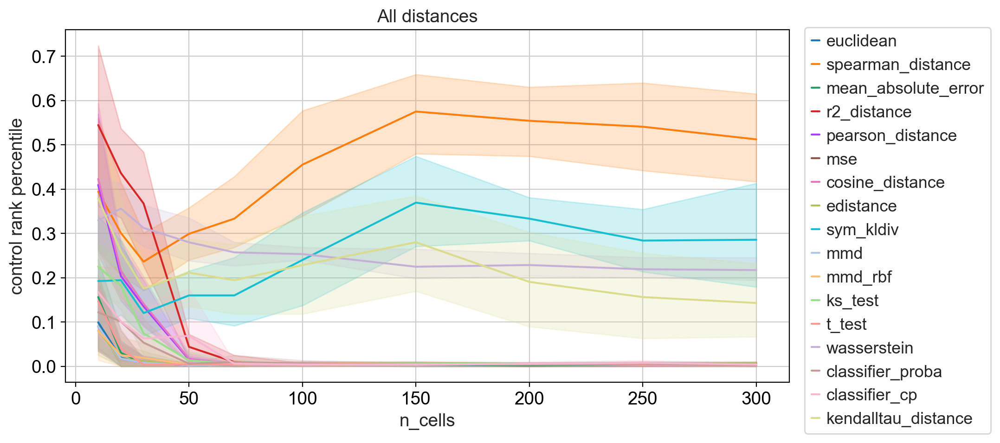

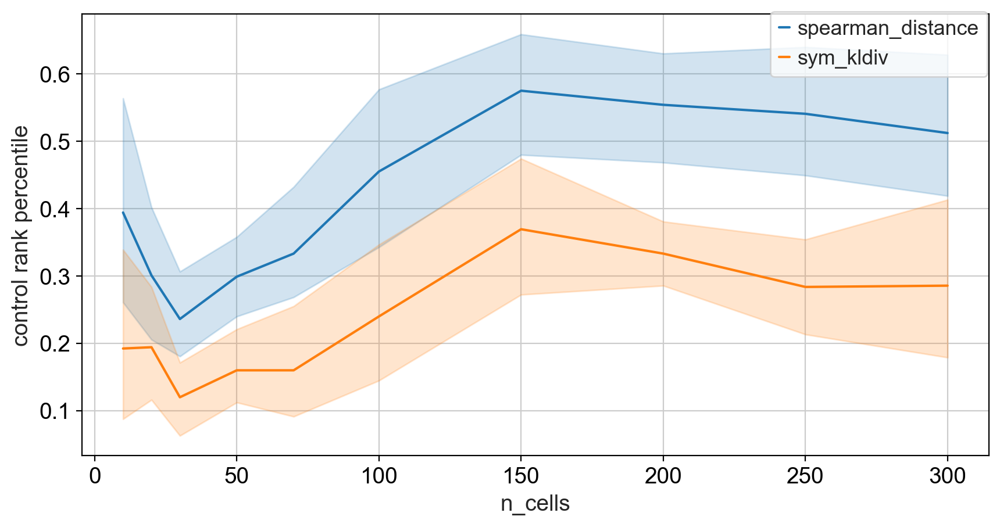

,metric,plateau_found,overall_gets_worse_too_much,plateau_start_n,pmax,total_observed_gain,marginal_gain_threshold,plateau_n_values
0,classifier_cp,True,False,100.0,0.004952,0.163810,0.05,"[100, 150, 200, 250, 300]"
1,classifier_proba,True,False,20.0,0.021164,0.120000,0.05,"[20, 30, 50, 70, 100, 150, 200, 250, 300]"
2,cosine_distance,True,False,70.0,0.004444,0.419048,0.05,"[70, 100, 150, 200, 250, 300]"
3,edistance,True,False,30.0,0.005476,0.074286,0.05,"[30, 50, 70, 100, 150, 200, 250, 300]"
4,euclidean,True,False,30.0,0.004762,0.093333,0.05,"[30, 50, 70, 100, 150, 200, 250, 300]"
5,kendalltau_distance,True,False,250.0,0.149524,0.236190,0.05,"[250, 300]"
6,ks_test,True,False,70.0,0.005079,0.220952,0.05,"[70, 100, 150, 200, 250, 300]"
7,mean_absolute_error,True,False,30.0,0.004048,0.152381,0.05,"[30, 50, 70, 100, 150, 200, 250, 300]"
8,mmd,True,False,30.0,0.004524,0.085714,0.05,"[30, 50, 70, 100, 150, 200, 250, 300]"
9,mmd_rbf,True,False,30.0,0.006190,0.076190,0.05,"[30, 50, 70, 100, 150, 200, 250, 300]"


tahoeHT29


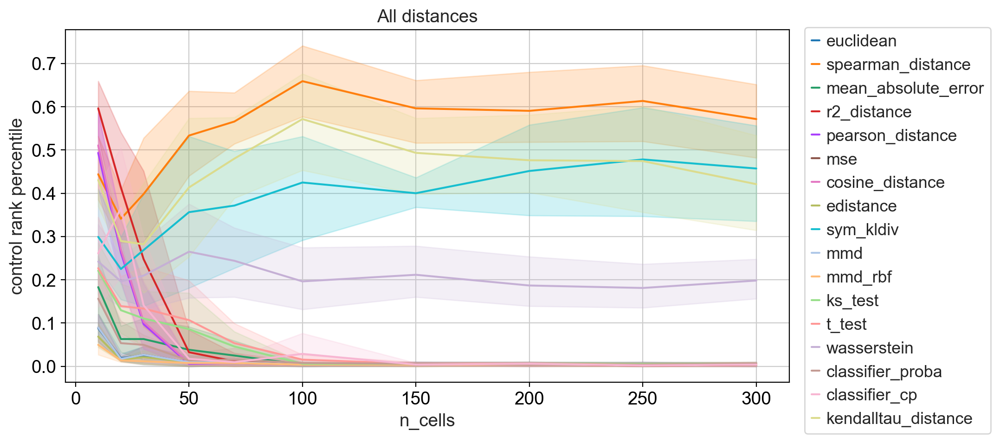

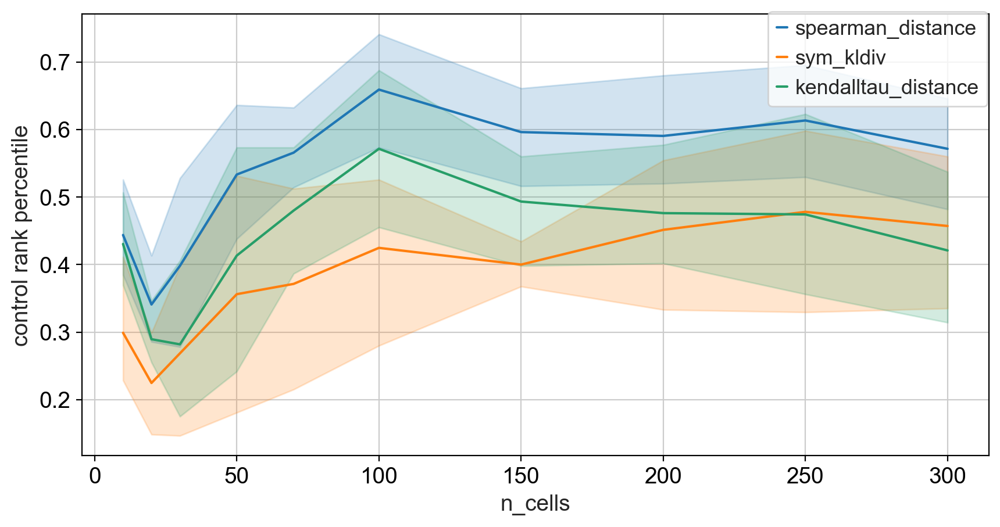

,metric,plateau_found,overall_gets_worse_too_much,plateau_start_n,pmax,total_observed_gain,marginal_gain_threshold,plateau_n_values
0,classifier_cp,True,False,70.0,0.008889,0.257143,0.05,"[70, 100, 150, 200, 250, 300]"
1,classifier_proba,True,False,30.0,0.013095,0.150476,0.05,"[30, 50, 70, 100, 150, 200, 250, 300]"
2,cosine_distance,True,False,70.0,0.005079,0.506667,0.05,"[70, 100, 150, 200, 250, 300]"
3,edistance,True,False,30.0,0.007143,0.064762,0.05,"[30, 50, 70, 100, 150, 200, 250, 300]"
4,euclidean,True,False,30.0,0.008333,0.083810,0.05,"[30, 50, 70, 100, 150, 200, 250, 300]"
5,kendalltau_distance,False,False,NaN,NaN,0.009524,0.05,[]
6,ks_test,True,False,30.0,0.033810,0.215238,0.05,"[30, 50, 70, 100, 150, 200, 250, 300]"
7,mean_absolute_error,True,False,30.0,0.018571,0.179048,0.05,"[30, 50, 70, 100, 150, 200, 250, 300]"
8,mmd,True,False,30.0,0.008810,0.083810,0.05,"[30, 50, 70, 100, 150, 200, 250, 300]"
9,mmd_rbf,True,False,20.0,0.006561,0.045714,0.05,"[20, 30, 50, 70, 100, 150, 200, 250, 300]"


In [15]:
summary_dfs = []
for dataset in ['tahoeBT474', 'garcia', 'sim', 'mcfarland', 'norman', 'satinha', 'schiebinger', 'spA549', 'spK562', 'spMCF7', 'tahoe', 'tahoeHT29']:
    print(dataset)
    with open(f'/lustre/scratch/users/yuge.ji/metrics_revisions/{dataset}.pkl', 'rb') as file:
        results = pickle.load(file)
#     print(results.keys())

    pwdfs, ctrl_ranks = plot(['n_cells', 'lognorm'], results, plot=False)
    ctrl_ranks['n_cells'] = ctrl_ranks['n_cells'].astype(int)

    summary_df, curve_df = identify_pmax_by_marginal_gain(
        ctrl_ranks,
        perf_col="rank",
        metric_col="metric",
        n_col="n_cells",
        marginal_frac=0.05,
        require_consecutive=2,
        threshold_mode="absolute",  # for PDR which is limited to [0, 1)
        perf_range=1.0,
    )
    
    plt.figure(figsize=(10, 5))
    sns.lineplot(
        # only plot the distances which did not plateau to see what happened
        data=ctrl_ranks,
        x='n_cells', y='rank', hue='metric')
    plt.ylabel('control rank percentile')
    plt_legend()
    plt.title('All distances')
    plt.show()
    
    plt.figure(figsize=(10, 5))
    sns.lineplot(
        # only plot the distances which did not plateau to see what happened
        data=ctrl_ranks[ctrl_ranks.metric.isin(summary_df[summary_df.plateau_found == False].metric.values)],
        x='n_cells', y='rank', hue='metric')
    plt.ylabel('control rank percentile')
    plt_legend()
    plt.show()
    
    display(summary_df)
    summary_df['dataset'] = dataset
    summary_dfs.append(summary_df)

,metric,n_datasets,n_plateau,frac_plateau,mean_plateau_start_n,median_plateau_start_n
0,wasserstein,12,11,0.916667,64.545455,20.0
1,cosine_distance,12,11,0.916667,69.090909,70.0
2,pearson_distance,12,11,0.916667,69.090909,70.0
3,edistance,12,11,0.916667,70.000000,30.0
4,mmd,12,11,0.916667,70.000000,30.0
5,mse,12,11,0.916667,70.000000,30.0
6,euclidean,12,11,0.916667,71.818182,30.0
7,mean_absolute_error,12,11,0.916667,71.818182,30.0
8,t_test,12,11,0.916667,87.272727,30.0
9,mmd_rbf,12,10,0.833333,41.000000,25.0


overall_n_plateaus: 164
overall_n_total: 204
overall_mean_plateau_start_n: 69.02439024390245
overall_median_plateau_start_n: 30.0


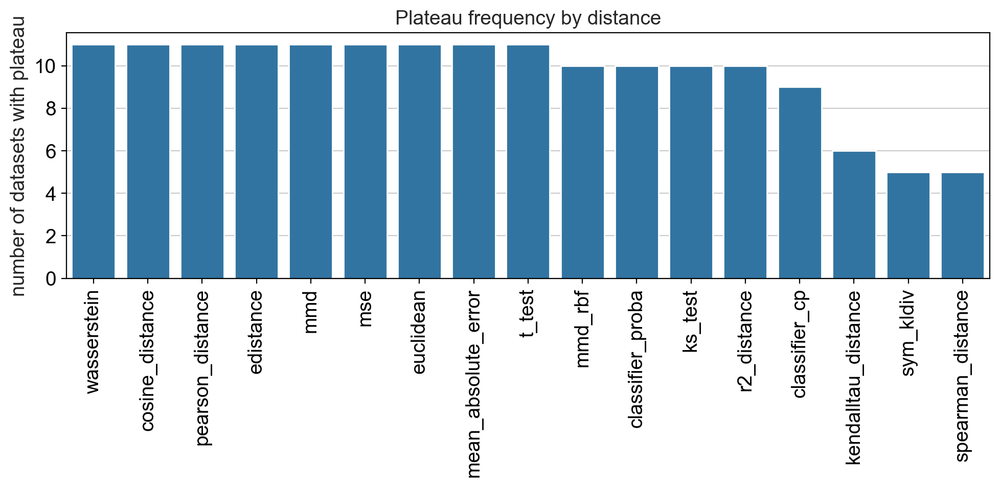

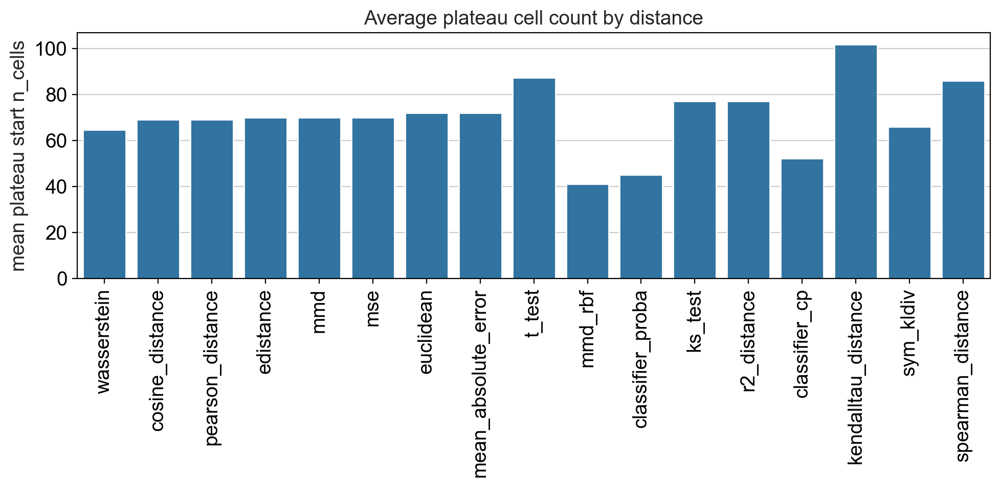

,metric,n_plateau,frac_plateau,mean_plateau_start_n
0,wasserstein,11,0.916667,64.545455
1,cosine_distance,11,0.916667,69.090909
2,pearson_distance,11,0.916667,69.090909
3,edistance,11,0.916667,70.000000
4,mmd,11,0.916667,70.000000
5,mse,11,0.916667,70.000000
6,euclidean,11,0.916667,71.818182
7,mean_absolute_error,11,0.916667,71.818182
8,t_test,11,0.916667,87.272727
9,mmd_rbf,10,0.833333,41.000000


In [16]:
all_summary = pd.concat(summary_dfs, ignore_index=True)

per_metric = (
    all_summary
    .groupby("metric", as_index=False)
    .agg(
        n_datasets=("dataset", "nunique"),
        n_plateau=("plateau_found", "sum"),
        frac_plateau=("plateau_found", "mean"),
        mean_plateau_start_n=("plateau_start_n", "mean"),
        median_plateau_start_n=("plateau_start_n", "median"),
    )
    .sort_values(["n_plateau", "mean_plateau_start_n"], ascending=[False, True])
    .reset_index(drop=True)
)

display(per_metric)

# overall average plateau cell count across all dataset-distance pairs where plateau was found
overall_mean_plateau_start_n = all_summary.loc[all_summary["plateau_found"], "plateau_start_n"].mean()
overall_median_plateau_start_n = all_summary.loc[all_summary["plateau_found"], "plateau_start_n"].median()
overall_n_plateaus = all_summary["plateau_found"].sum()
overall_n_total = len(all_summary)

print("overall_n_plateaus:", overall_n_plateaus)
print("overall_n_total:", overall_n_total)
print("overall_mean_plateau_start_n:", overall_mean_plateau_start_n)
print("overall_median_plateau_start_n:", overall_median_plateau_start_n)

# plot 1: how many datasets each metric plateaued in
plt.figure(figsize=(10, 5))
sns.barplot(data=per_metric, x="metric", y="n_plateau")
plt.xticks(rotation=90)
plt.ylabel("number of datasets with plateau")
plt.xlabel("")
plt.title("Plateau frequency by distance")
plt.tight_layout()
plt.show()

# plot 2: average plateau cell count for each metric
plot_df = per_metric.dropna(subset=["mean_plateau_start_n"]).copy()

plt.figure(figsize=(10, 5))
sns.barplot(data=plot_df, x="metric", y="mean_plateau_start_n")
plt.xticks(rotation=90)
plt.ylabel("mean plateau start n_cells")
plt.xlabel("")
plt.title("Average plateau cell count by distance")
plt.tight_layout()
plt.show()

# optional: one compact table with just the main outputs
final_table = per_metric[["metric", "n_plateau", "frac_plateau", "mean_plateau_start_n"]].copy()
display(final_table)

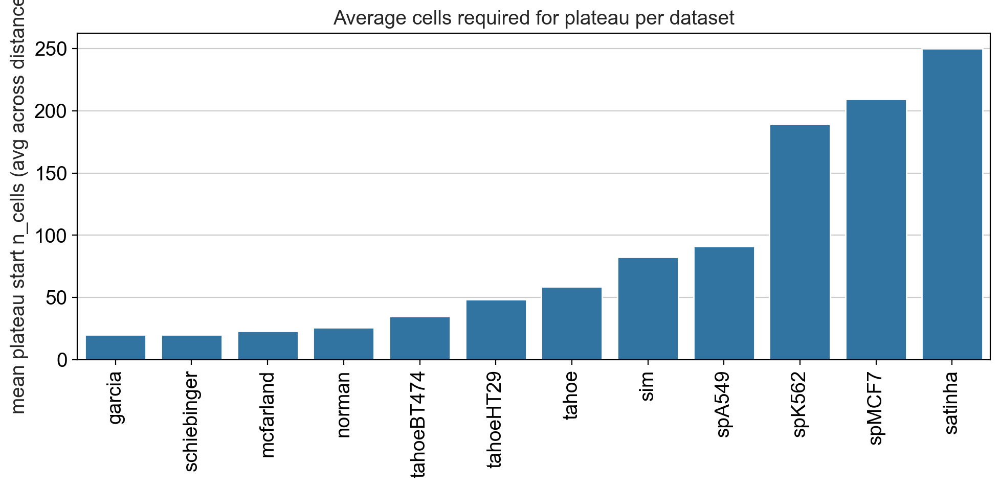

In [17]:
# average plateau cell count per dataset (averaged across distances)
per_dataset = (
    all_summary[all_summary["plateau_found"]]
    .groupby("dataset", as_index=False)
    .agg(mean_plateau_start_n=("plateau_start_n", "mean"))
    .sort_values("mean_plateau_start_n")
)

plt.figure(figsize=(10, 5))
sns.barplot(data=per_dataset, x="dataset", y="mean_plateau_start_n")
plt.xticks(rotation=90)
plt.ylabel("mean plateau start n_cells (avg across distances)")
plt.xlabel("")
plt.title("Average cells required for plateau per dataset")
plt.tight_layout()
plt.show()

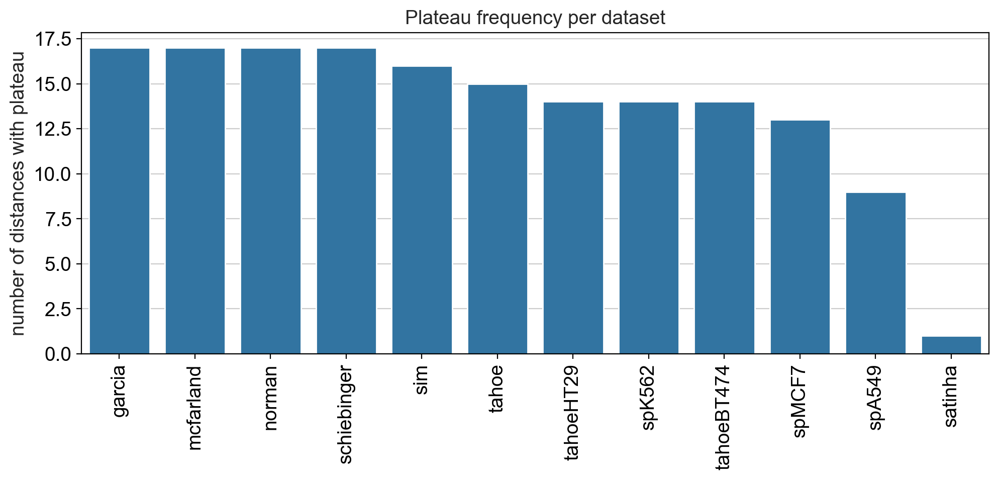

,dataset,n_plateau,frac_plateau,n_distances
0,garcia,17,1.000000,17
1,mcfarland,17,1.000000,17
2,norman,17,1.000000,17
4,schiebinger,17,1.000000,17
5,sim,16,0.941176,17
9,tahoe,15,0.882353,17
11,tahoeHT29,14,0.823529,17
7,spK562,14,0.823529,17
10,tahoeBT474,14,0.823529,17
8,spMCF7,13,0.764706,17


In [18]:
# how many distances plateaued per dataset
per_dataset_plateau_count = (
    all_summary.groupby("dataset", as_index=False)
    .agg(
        n_plateau=("plateau_found", "sum"),
        frac_plateau=("plateau_found", "mean"),
        n_distances=("metric", "nunique"),
    )
    .sort_values("n_plateau", ascending=False)
)

plt.figure(figsize=(10, 5))
sns.barplot(data=per_dataset_plateau_count, x="dataset", y="n_plateau")
plt.xticks(rotation=90)
plt.ylabel("number of distances with plateau")
plt.xlabel("")
plt.title("Plateau frequency per dataset")
plt.tight_layout()
plt.show()

display(per_dataset_plateau_count)

In [32]:
from adjustText import adjust_text
import matplotlib.pyplot as plt
import seaborn as sns

def plot_labeled_scatter(df, x, y, label):
    plt.figure(figsize=(8, 6))
    ax = sns.scatterplot(data=df, x=x, y=y, s=120)

    texts = [
        plt.text(row[x], row[y], str(row[label]), fontsize=9)
        for _, row in df.iterrows()
    ]
    adjust_text(texts, ax=ax)

    ax.invert_yaxis()
    ax.set_axisbelow(True)
    ax.grid(True, which="major", axis="both", linestyle="-", linewidth=0.5, alpha=0.3)

    return ax

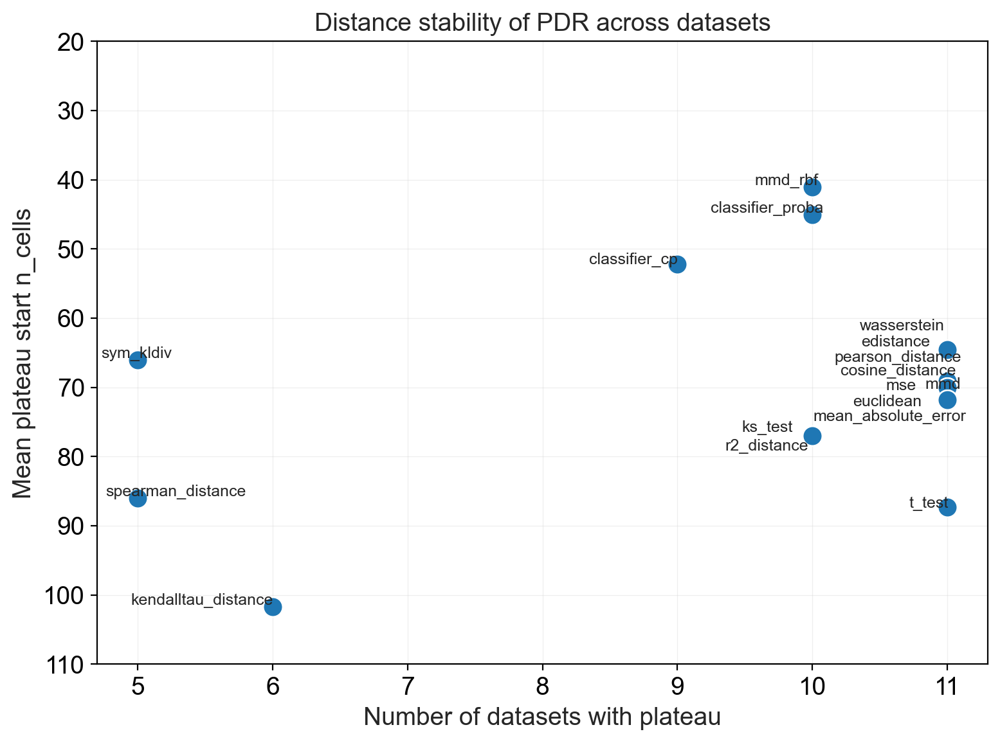

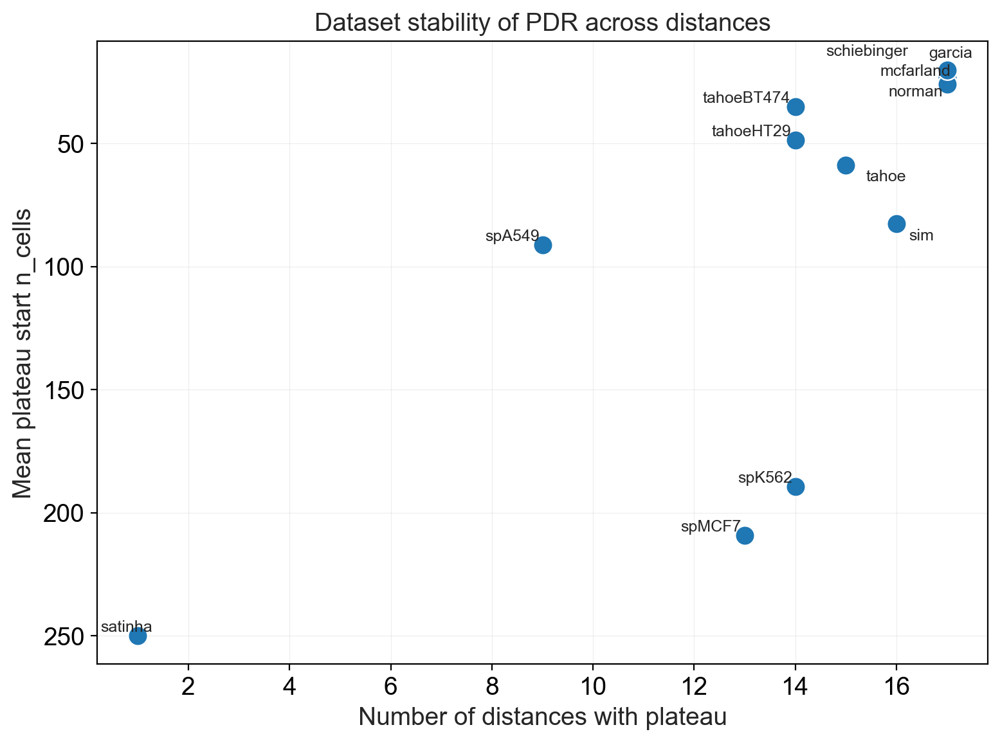

In [38]:
plot_labeled_scatter(per_metric, x="n_plateau", y="mean_plateau_start_n", label="metric")
plt.ylim(110, 20)
plt.xlabel("Number of datasets with plateau")
plt.ylabel("Mean plateau start n_cells")
plt.title("Distance stability of PDR across datasets")
plt.tight_layout()
plt.savefig('./figures/ncells_PDR_distances.svg')
plt.show()

plot_dataset = (
    per_dataset_plateau_count.merge(
        per_dataset[["dataset", "mean_plateau_start_n"]],
        on="dataset",
        how="left"
    )
)
plot_labeled_scatter(plot_dataset, x="n_plateau", y="mean_plateau_start_n", label="dataset")
plt.xlabel("Number of distances with plateau")
plt.ylabel("Mean plateau start n_cells")
plt.title("Dataset stability of PDR across distances")
plt.tight_layout()
plt.savefig('./figures/ncells_PDR_datasets.svg')
plt.show()